In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('winequality-red.csv')

In [3]:
df.quality.value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [4]:
ProfileReport(df)

In [5]:
x = df.drop(['quality'],axis = 1)

In [6]:
y = df.quality

In [7]:
x.shape

(1599, 11)

In [8]:
y.shape

(1599,)

In [9]:
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size = .25,random_state = 30)

In [10]:
dt_model= DecisionTreeClassifier()

In [11]:
dt_model.fit(X_train,y_train)

DecisionTreeClassifier()

In [12]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(609.5810229380319, 211.4, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(354.7292780384028, 199.32, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(220.73675812786385, 187.24, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(81.82650556404103, 175.16, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(57.14842897665285, 163.07999999999998, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.480689504691252, 151.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.688413702814751, 138.92000000000002, 'X[0] <= 7.1\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.7922758018765, 126.84, 'X[2] <= 0.14\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.89613790093825, 114.75999999999999, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0

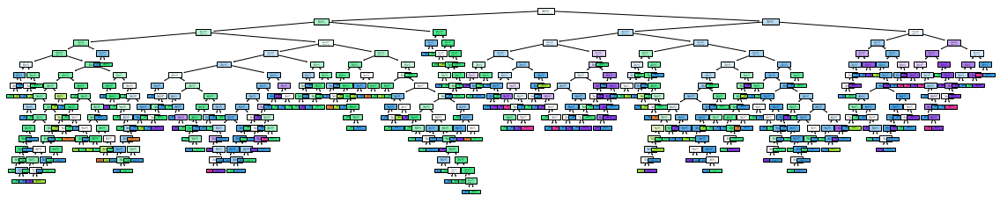

In [14]:
plt.figure(figsize=(20,4))
tree.plot_tree(dt_model,filled=True)

In [15]:
df1 = df.head(30)

In [17]:
x = df1.drop(['quality'],axis = 1)

In [18]:
y = df1.quality

In [19]:
dt_model1 = DecisionTreeClassifier()

In [20]:
dt_model1.fit(x,y)

DecisionTreeClassifier()

[Text(697.5, 199.32, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(465.0, 163.07999999999998, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(279.0, 126.83999999999999, 'X[6] <= 17.0\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(186.0, 90.6, 'X[10] <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(93.0, 54.359999999999985, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(279.0, 54.359999999999985, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(372.0, 90.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(651.0, 126.83999999999999, 'X[10] <= 9.05\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(558.0, 90.6, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(744.0, 90.6, 'X[1] <= 0.415\ngini = 0.091\nsamples = 21\nvalue = [0, 20, 1, 0]'),
 Text(651.0, 54.359999999999985, 'X[4] <= 0.084\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0]'),
 Text(558.0, 18.119999999999976, '

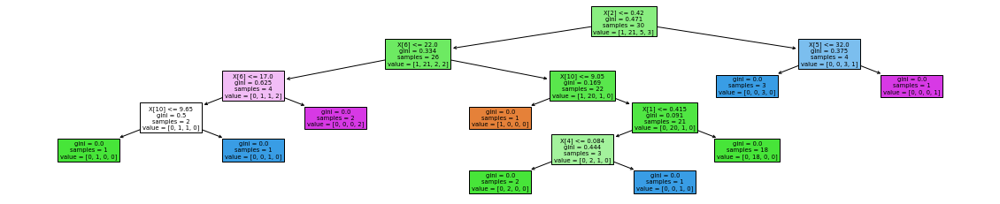

In [22]:
plt.figure(figsize=(20,4))
tree.plot_tree(dt_model1,filled=True)

# proning

In [23]:
path = dt_model1.cost_complexity_pruning_path(x,y)

In [24]:
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [25]:
ccp_alpha = path.ccp_alphas

In [26]:
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [27]:
dt_models2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x,y)
    dt_models2.append(dt_m)

In [28]:
dt_models2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [29]:
scores = []

In [33]:
for model in dt_models2:
    scores.append(model.score(X_test,y_test))

In [34]:
scores

[0.47, 0.465, 0.46, 0.4125, 0.435, 0.44, 0.485, 0.4225]

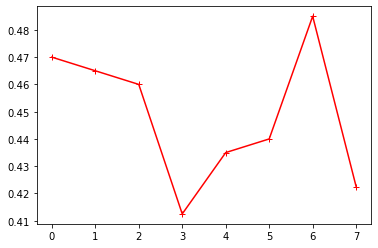

In [44]:
plt.plot(scores,'r-+')
plt.xlabel = 'iteration'
plt.ylabel = 'scores'



In [46]:
train_score = [i.score(x,y) for i in dt_models2]

In [48]:
test_score = [i.score(X_test,y_test) for i in dt_models2]

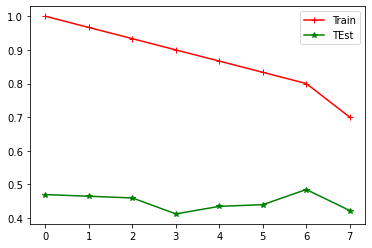

In [56]:
plt.plot(train_score,'r-+',label = 'Train')
plt.plot(test_score,'g-*',label = 'TEst')
plt.legend()

In [68]:
x = df.head(800).drop(['quality'],axis = 1)
y = df.head(800).quality

In [69]:
dt_models3 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x,y)
    dt_models3.append(dt_m)

In [70]:
train_score = [i.score(x,y) for i in dt_models2]

In [71]:
test_score = [i.score(X_test,y_test) for i in dt_models2]

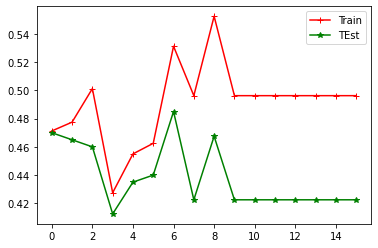

In [72]:
plt.plot(train_score,'r-+',label = 'Train')
plt.plot(test_score,'g-*',label = 'TEst')
plt.legend()